# Pancreas dataset from scanpy tutorial

From Scanpy: "The following data has been used in the scGen paper [Lotfollahi et al., 2019], has been used here, was curated here and can be downloaded from here (the BBKNN paper).

It contains data for human pancreas from 4 different studies [Baron et al., 2016, Muraro et al., 2016, Segerstolpe et al., 2016, Wang et al., 2016], which have been used in the seminal papers on single-cell dataset integration [Butler et al., 2018, Haghverdi et al., 2018] and many times ever since."

## Basic setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import Concord as ccd
import torch
import warnings
import scanpy as sc
warnings.filterwarnings('ignore')

adata = sc.read("../data/scanpy_pancreas/pancreas.h5ad", backup_url="https://www.dropbox.com/s/qj1jlm9w10wmt0u/pancreas.h5ad?dl=1")


In [3]:
from pathlib import Path
import time
proj_name = "pancreas_scanpy"
save_dir = Path(f"../save/{proj_name}_{time.strftime('%b%d')}/")
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
seed = 0

In [4]:
# adata.X is already scaled, but Concord expects non-negative values, either raw counts or log transformed counts are fine. 
adata = sc.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs, obsm=adata.obsm, uns=adata.uns)

## PCA + UMAP

In [13]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000)  # Identify highly variable genes
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=30)  
sc.tl.umap(adata, min_dist=0.1)

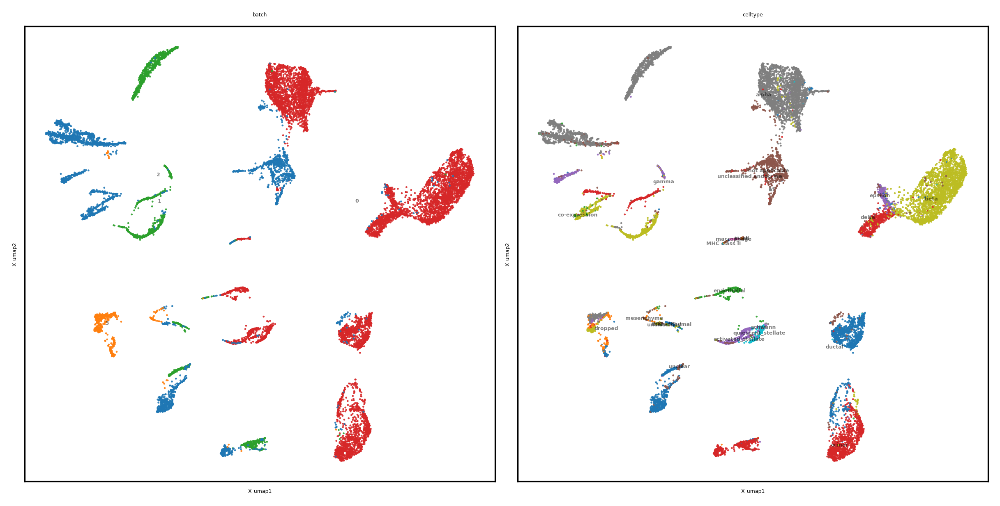

In [17]:
show_basis = 'X_umap'
color_by = ["batch", "celltype"]
file_suffix = f"{proj_name}_{time.strftime('%b%d-%H%M')}"
ccd.pl.plot_embedding(
    adata, basis=show_basis, color_by=color_by, figsize=(8, 4), dpi=300, ncols=2, font_size=3, point_size=5, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

## BBKNN used by scanpy tutorial

Use `pip install bbknn` to install the package if not installed.

In [7]:
# subset adata to variable genes
adata_hvg = adata[:, adata.var.highly_variable]
sc.external.pp.bbknn(adata_hvg, batch_key="batch")

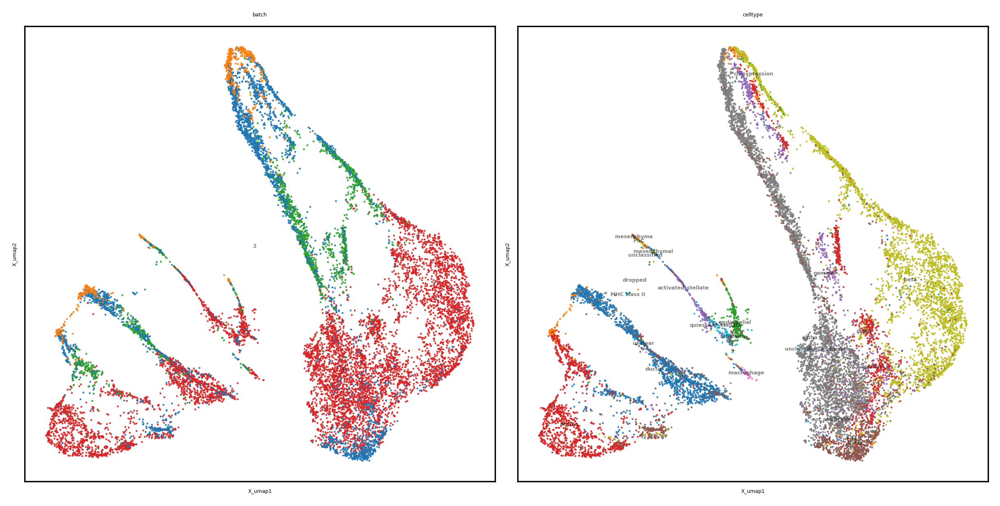

In [8]:
sc.tl.umap(adata_hvg, min_dist=0.1)
show_basis = 'X_umap'
color_by = ["batch", "celltype"]
ccd.pl.plot_embedding(
    adata_hvg, basis=show_basis, color_by=color_by, figsize=(8, 4), dpi=300, ncols=2, font_size=3, point_size=5, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

## Run Concord

In [14]:
feature_list = ccd.ul.select_features(adata, 
                                      n_top_features=5000, 
                                      flavor='seurat_v3', normalize=False, log1p=False)

In [15]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=feature_list, # top 10000 VEGs selected above
                      domain_key='batch', # key indicating batch
                      augmentation_mask_prob = 0.5, # augmentation mask probability, recommend between 0.1 and 0.7
                      clr_temperature = 0.5, # temperature for NT-Xent loss
                      seed=seed, # random seed
                      p_intra_domain = 1.0, # probability of intra-domain sampling
                      verbose=False, # print training progress
                      inplace=False, # whether to modify original adata, set to False if you want to keep all expressions
                      device=device # device to run on
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
file_suffix = f"{proj_name}_{time.strftime('%b%d-%H%M')}"
output_key = 'Concord'
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

adata.obsm = cur_ccd.adata.obsm # If not inplace
# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Epoch 0 Training: 227it [00:02, 86.19it/s, loss=4.35]
Epoch 4 Training: 100%|██████████| 227/227 [00:02<00:00, 85.29it/s, loss=3.78]


## Visualize Concord latent with UMAP

### 2D UMAP

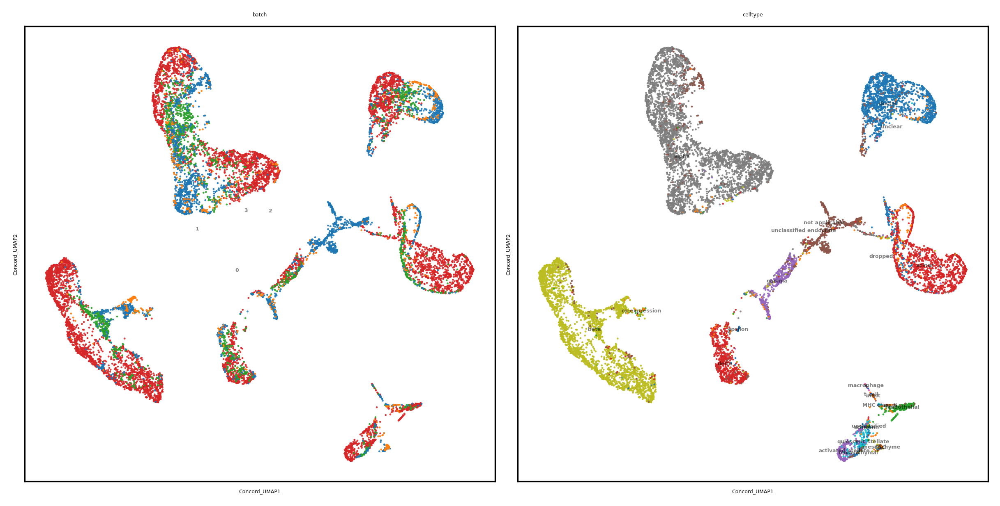

In [16]:
ccd.ul.run_umap(adata, source_key=output_key, umap_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
color_by = ["batch", "celltype"]
ccd.pl.plot_embedding(
    adata, basis=show_basis, color_by=color_by, figsize=(8, 4), dpi=300, ncols=2, font_size=3, point_size=5, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

### 3D UMAP

It is best to use 3D UMAP rather than 2D to visualize Concord latent, because 2D may not be enough to 'unpack' the complex structures learned by Concord, thus tends to break trajectories.

In [18]:
import plotly.io as pio
pio.renderers.default = 'notebook'
ccd.ul.run_umap(adata,  source_key=output_key, umap_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=15, min_dist=0.1, metric='euclidean')
show_basis = f'{output_key}_UMAP_3D'
#show_cols = ['log_nFeature', 'stage_numeric', 'group', 'cell_state', 'cell_type']
show_col = 'batch'
ccd.pl.plot_embedding_3d(
    adata, basis=show_basis, color_by=show_col,
    save_path=save_dir / f'{output_key}_UMAP_3D_{file_suffix}.html',
    point_size=1, opacity=0.8, width=1500, height=1000
)

In [19]:
show_col = 'celltype'
ccd.pl.plot_embedding_3d(
    adata, basis=show_basis, color_by=show_col,
    save_path=save_dir / f'{output_key}_UMAP_3D_{file_suffix}.html',
    point_size=1, opacity=0.8, width=1500, height=1000
)

## Doublet calling with Concord (Optional)

### Simulate synthetic doublets

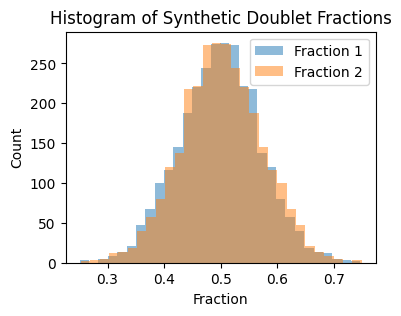

In [20]:
from Concord.utils.doublet_utils import generate_synthetic_doublets
adata_wt_syndoub = generate_synthetic_doublets(adata, doublet_synth_ratio=0.2, seed=seed, batch_key='batch', droplet_type_key = 'droplet_label', 
                                               mean=0.5, var=0.1, clip_range=(0.2, 0.8), combine_with_original=True, plot_histogram=True)

In [21]:
adata_wt_syndoub.obs['droplet_label'].value_counts()

droplet_label
singlet    14693
doublet     2937
Name: count, dtype: int64

In [22]:
cur_ccd = ccd.Concord(adata=adata_wt_syndoub, 
                      input_feature=feature_list, # top VEGs selected above
                      domain_key='batch', # key indicating batch
                      augmentation_mask_prob = 0.5, # augmentation mask probability, recommend between 0.1 and 0.7
                      seed=seed, # random seed
                      p_intra_domain = 1.0, # probability of intra-domain sampling
                      verbose=True, # print training progress
                      device=device, # device to run on
                      inplace=False, # whether to modify original adata, set to False if you want to keep all expressions, set to True if you want to save memory
                      # New doublet arguments
                      train_frac = 0.9, # fraction of data to use for training
                      use_classifier = True, # use classifier for doublet detection
                      class_key = 'droplet_label', # key indicating if a cell is a doublet
                      ) 

file_suffix = f"{proj_name}_wt_syndoub_{time.strftime('%b%d-%H%M')}"
output_key = 'Concord_wt_syndoub'
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a file, so that it can be loaded later/
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - INFO - Setting sampler_knn to 352 to be 1/50 the number of cells in the dataset. You can change this value by setting sampler_knn in the configuration.
Concord - INFO - Column 'batch' is now of type: category
Concord - INFO - Column 'droplet_label' is now of type: category
Concord - INFO - Encoder input dim: 5000
Concord - INFO - Decoder input dim: 40
Concord - INFO - Classifier input dim: 32
Concord - INFO - Model loaded to device: cuda:2
Concord - INFO - Total number of parameters: 1296298
Concord.model.dataloader - INFO - Preprocessing adata...
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Skip normalization.
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Storing in the specified layer.
Concord.utils.preprocessor - INFO - Filtering features with provided list (5000 features)...
Concord.model.anndataset - INFO - Initialized dataset with 17630 samples. Data structure: ['input', 'domain', 'class', 'idx']
Concord.model.dataloade

Epoch 0 Training: 273it [00:03, 75.94it/s, loss=4.27]

Concord - INFO - Epoch   0 | Train Loss: 4.80, MSE: 0.37, CLASS: 0.44, CONTRAST: 4.00, IMPORTANCE: 0.00


Concord - INFO - Epoch:   0 | Train accuracy:  0.83 | precision: 0: 0.64, 1: 0.84 | recall: 0: 0.11, 1: 0.99 | f1: 0: 0.18, 1: 0.91


Epoch 0 Validation: 242it [00:01, 134.58it/s, loss=1.39] 

Concord - INFO - Epoch   0 | Val Loss: 1.84, MSE: 0.16, CLASS: 0.30, CONTRAST: 1.38, IMPORTANCE: 0.00


Concord - INFO - Epoch:   0 | Val accuracy:  0.88 | precision: 0: 0.82, 1: 0.88 | recall: 0: 0.32, 1: 0.99 | f1: 0: 0.46, 1: 0.93
Concord - INFO - New best model found at epoch 1 with validation loss: 1.8390
Concord - INFO - Starting epoch 2/5
Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 15867
Concord - INFO - Number of samples in val_dataloader: 1763


Epoch 1 Training: 100%|██████████| 273/273 [00:03<00:00, 80.39it/s, loss=4.64]

Concord - INFO - Epoch   1 | Train Loss: 4.37, MSE: 0.21, CLASS: 0.37, CONTRAST: 3.79, IMPORTANCE: 0.00


Concord - INFO - Epoch:   1 | Train accuracy:  0.86 | precision: 0: 0.73, 1: 0.87 | recall: 0: 0.30, 1: 0.98 | f1: 0: 0.43, 1: 0.92


Epoch 1 Validation:  88%|████████▊ | 241/273 [00:01<00:00, 167.33it/s, loss=1.79] 

Concord - INFO - Epoch   1 | Val Loss: 1.64, MSE: 0.14, CLASS: 0.28, CONTRAST: 1.22, IMPORTANCE: 0.00


Concord - INFO - Epoch:   1 | Val accuracy:  0.88 | precision: 0: 0.76, 1: 0.89 | recall: 0: 0.41, 1: 0.97 | f1: 0: 0.54, 1: 0.93
Concord - INFO - New best model found at epoch 2 with validation loss: 1.6441
Concord - INFO - Starting epoch 3/5
Concord - INFO - Processing chunk 1/1 for epoch 3
Concord - INFO - Number of samples in train_dataloader: 15867
Concord - INFO - Number of samples in val_dataloader: 1763


Epoch 2 Training: 100%|██████████| 273/273 [00:03<00:00, 72.75it/s, loss=4.24]

Concord - INFO - Epoch   2 | Train Loss: 4.24, MSE: 0.18, CLASS: 0.35, CONTRAST: 3.71, IMPORTANCE: 0.00


Concord - INFO - Epoch:   2 | Train accuracy:  0.87 | precision: 0: 0.76, 1: 0.88 | recall: 0: 0.39, 1: 0.97 | f1: 0: 0.51, 1: 0.92


Epoch 2 Validation:  88%|████████▊ | 239/273 [00:01<00:00, 155.66it/s, loss=1.38] 

Concord - INFO - Epoch   2 | Val Loss: 1.56, MSE: 0.12, CLASS: 0.26, CONTRAST: 1.18, IMPORTANCE: 0.00


Concord - INFO - Epoch:   2 | Val accuracy:  0.89 | precision: 0: 0.81, 1: 0.89 | recall: 0: 0.43, 1: 0.98 | f1: 0: 0.56, 1: 0.94
Concord - INFO - New best model found at epoch 3 with validation loss: 1.5638
Concord - INFO - Starting epoch 4/5
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 15867
Concord - INFO - Number of samples in val_dataloader: 1763


Epoch 3 Training: 100%|██████████| 273/273 [00:03<00:00, 74.27it/s, loss=4]   

Concord - INFO - Epoch   3 | Train Loss: 4.16, MSE: 0.17, CLASS: 0.34, CONTRAST: 3.66, IMPORTANCE: 0.00


Concord - INFO - Epoch:   3 | Train accuracy:  0.88 | precision: 0: 0.77, 1: 0.89 | recall: 0: 0.41, 1: 0.97 | f1: 0: 0.54, 1: 0.93


Epoch 3 Validation:  88%|████████▊ | 240/273 [00:01<00:00, 150.97it/s, loss=1.16] 

Concord - INFO - Epoch   3 | Val Loss: 1.54, MSE: 0.12, CLASS: 0.26, CONTRAST: 1.16, IMPORTANCE: 0.00


Concord - INFO - Epoch:   3 | Val accuracy:  0.90 | precision: 0: 0.85, 1: 0.90 | recall: 0: 0.48, 1: 0.98 | f1: 0: 0.61, 1: 0.94
Concord - INFO - New best model found at epoch 4 with validation loss: 1.5438
Concord - INFO - Starting epoch 5/5
Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 15867
Concord - INFO - Number of samples in val_dataloader: 1763


Epoch 4 Training: 100%|██████████| 273/273 [00:03<00:00, 72.97it/s, loss=3.94]

Concord - INFO - Epoch   4 | Train Loss: 4.11, MSE: 0.16, CLASS: 0.33, CONTRAST: 3.63, IMPORTANCE: 0.00


Concord - INFO - Epoch:   4 | Train accuracy:  0.88 | precision: 0: 0.76, 1: 0.89 | recall: 0: 0.43, 1: 0.97 | f1: 0: 0.55, 1: 0.93


Epoch 4 Validation:  86%|████████▋ | 236/273 [00:01<00:00, 161.66it/s, loss=1.7]  

Concord - INFO - Epoch   4 | Val Loss: 1.52, MSE: 0.11, CLASS: 0.27, CONTRAST: 1.13, IMPORTANCE: 0.00


Concord - INFO - Epoch:   4 | Val accuracy:  0.89 | precision: 0: 0.86, 1: 0.89 | recall: 0: 0.48, 1: 0.98 | f1: 0: 0.61, 1: 0.93
Concord - INFO - New best model found at epoch 5 with validation loss: 1.5152
Concord - INFO - Best model state loaded into the model before final save.
Concord - INFO - Model saved to save/final_model.pth
Concord - INFO - Final model saved at: save/final_model.pth; Configuration saved at: save/config.json.
Concord.model.dataloader - INFO - Preprocessing adata...
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Skip normalization.
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Storing in the specified layer.
Concord.utils.preprocessor - INFO - Filtering features with provided list (5000 features)...
Concord.model.anndataset - INFO - Initialized dataset with 17630 samples. Data structure: ['input', 'domain', 'class', 'idx']
Concord - INFO - Predicting for chunk 1/1


Concord_wt_syndoub_class_true  doublet  singlet
Concord_wt_syndoub_class_pred                  
doublet                           1473      286
singlet                           1464    14407


Text(0.5, 1.0, 'Confusion Matrix')

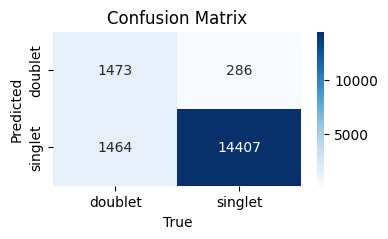

In [23]:
adata_wt_syndoub.obsm = cur_ccd.adata.obsm # If not inplace
adata_wt_syndoub.obs = cur_ccd.adata.obs # If not inplace
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
crosstab_result = pd.crosstab(adata_wt_syndoub.obs[f'{output_key}_class_pred'], adata_wt_syndoub.obs[f'{output_key}_class_true'])
print(crosstab_result)

# Plot confusion matrix as heatmap
plt.figure(figsize=(4,2))
sns.heatmap(crosstab_result, annot=True, fmt="d", cmap="Blues")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.title("Confusion Matrix")

In [28]:
adata_wt_syndoub.obs

,celltype,sample,n_genes,batch,n_counts,louvain,droplet_label,Concord_wt_syndoub_class_true,Concord_wt_syndoub_class_pred,class_prob_doublet,class_prob_singlet
human1_lib1.final_cell_0001-0,acinar,Baron,3526.0,0,22411.0,2,singlet,singlet,singlet,0.045450,0.954550
human1_lib1.final_cell_0002-0,acinar,Baron,4201.0,0,27949.0,2,singlet,singlet,singlet,0.059101,0.940899
human1_lib1.final_cell_0003-0,acinar,Baron,2119.0,0,16892.0,2,singlet,singlet,singlet,0.031126,0.968874
human1_lib1.final_cell_0004-0,acinar,Baron,2956.0,0,19299.0,2,singlet,singlet,singlet,0.055361,0.944639
human1_lib1.final_cell_0005-0,acinar,Baron,2715.0,0,15067.0,2,singlet,singlet,singlet,0.043646,0.956354
...,...,...,...,...,...,...,...,...,...,...,...
2932,NaN,NaN,NaN,3,NaN,NaN,doublet,doublet,singlet,0.072913,0.927087
2933,NaN,NaN,NaN,3,NaN,NaN,doublet,doublet,singlet,0.135804,0.864196
2934,NaN,NaN,NaN,3,NaN,NaN,doublet,doublet,singlet,0.461214,0.538786
2935,NaN,NaN,NaN,3,NaN,NaN,doublet,doublet,singlet,0.071255,0.928745


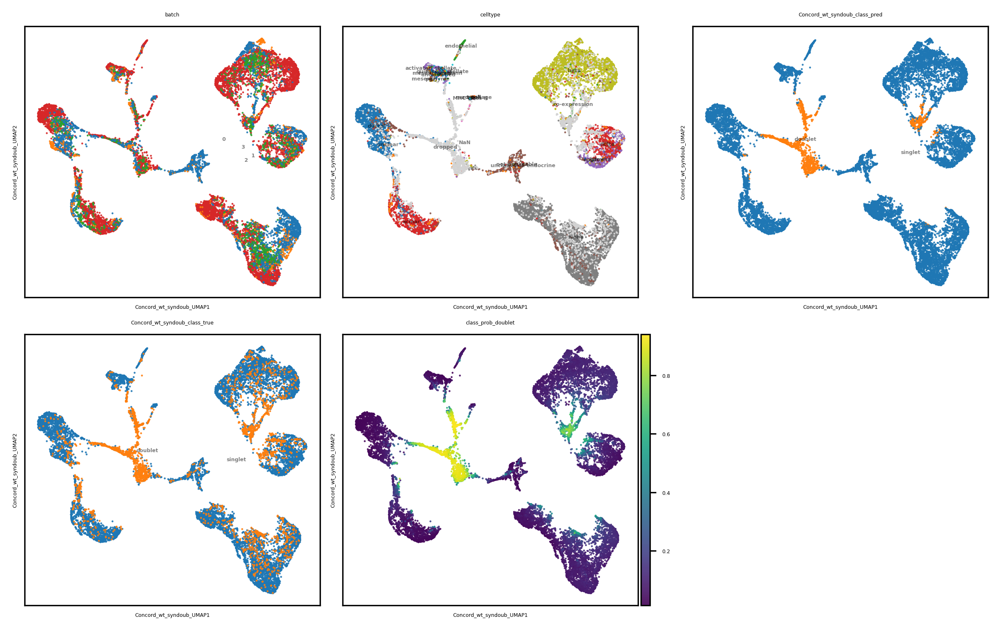

In [30]:
ccd.ul.run_umap(adata_wt_syndoub, source_key=output_key, umap_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
color_by = ["batch", "celltype", f'{output_key}_class_pred', f'{output_key}_class_true', f'class_prob_doublet']
ccd.pl.plot_embedding(
    adata_wt_syndoub, basis=show_basis, color_by=color_by, figsize=(8, 5), dpi=300, ncols=3, font_size=3, point_size=5, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

## Run on the singlet set

In [31]:
adata = adata_wt_syndoub[(adata_wt_syndoub.obs['droplet_label'] == 'singlet') & (adata_wt_syndoub.obs['Concord_wt_syndoub_class_pred'] == 'singlet')]
print(adata.shape)

(14407, 24516)


In [32]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=feature_list, # top VEGs selected above
                      domain_key='batch', # key indicating batch
                      augmentation_mask_prob = 0.5, # augmentation mask probability, recommend between 0.1 and 0.7
                      seed=seed, # random seed
                      p_intra_domain = 1.0, # probability of intra-domain sampling
                      verbose=True, # print training progress
                      inplace=False, # whether to modify original adata, set to False if you want to keep all expressions, True if you want to save memory
                      device=device # device to run on
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
file_suffix = f"{proj_name}_{time.strftime('%b%d-%H%M')}"
output_key = 'Concord'
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - INFO - Setting sampler_knn to 288 to be 1/50 the number of cells in the dataset. You can change this value by setting sampler_knn in the configuration.
Concord - INFO - Column 'batch' is already of type: category
Concord - INFO - Unused levels dropped for column 'batch'.
Concord - INFO - Encoder input dim: 5000
Concord - INFO - Decoder input dim: 40
Concord - INFO - Model loaded to device: cuda:2
Concord - INFO - Total number of parameters: 1295112
Concord.model.dataloader - INFO - Preprocessing adata...
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Skip normalization.
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Storing in the specified layer.
Concord.utils.preprocessor - INFO - Filtering features with provided list (5000 features)...
Concord.model.anndataset - INFO - Initialized dataset with 14407 samples. Data structure: ['input', 'domain', 'idx']
Concord.model.dataloader - INFO - Using existing embedding 'X_pca' from adat

Epoch 0 Training: 223it [00:02, 78.84it/s, loss=3.92]

Concord - INFO - Epoch   0 | Train Loss: 4.47, MSE: 0.41, CLASS: 0.00, CONTRAST: 4.06, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 2/5


Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 14407


Epoch 1 Training: 100%|██████████| 223/223 [00:02<00:00, 74.70it/s, loss=3.92]

Concord - INFO - Epoch   1 | Train Loss: 4.11, MSE: 0.23, CLASS: 0.00, CONTRAST: 3.88, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 3/5
Concord - INFO - Processing chunk 1/1 for epoch 3


Concord - INFO - Number of samples in train_dataloader: 14407


Epoch 2 Training: 100%|██████████| 223/223 [00:02<00:00, 80.12it/s, loss=3.94]

Concord - INFO - Epoch   2 | Train Loss: 3.99, MSE: 0.19, CLASS: 0.00, CONTRAST: 3.80, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 4/5
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 14407


Epoch 3 Training: 100%|██████████| 223/223 [00:02<00:00, 80.23it/s, loss=3.68]

Concord - INFO - Epoch   3 | Train Loss: 3.92, MSE: 0.18, CLASS: 0.00, CONTRAST: 3.74, IMPORTANCE: 0.00


Concord - INFO - Starting epoch 5/5
Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 14407


Epoch 4 Training: 100%|██████████| 223/223 [00:02<00:00, 81.88it/s, loss=3.69]

Concord - INFO - Epoch   4 | Train Loss: 3.88, MSE: 0.17, CLASS: 0.00, CONTRAST: 3.71, IMPORTANCE: 0.00


Concord - INFO - Model saved to save/final_model.pth
Concord - INFO - Final model saved at: save/final_model.pth; Configuration saved at: save/config.json.
Concord.model.dataloader - INFO - Preprocessing adata...
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Skip normalization.
Concord.utils.preprocessor - INFO - Data is already log1p transformed. Storing in the specified layer.
Concord.utils.preprocessor - INFO - Filtering features with provided list (5000 features)...
Concord.model.anndataset - INFO - Initialized dataset with 14407 samples. Data structure: ['input', 'domain', 'idx']
Concord - INFO - Predicting for chunk 1/1


Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP']


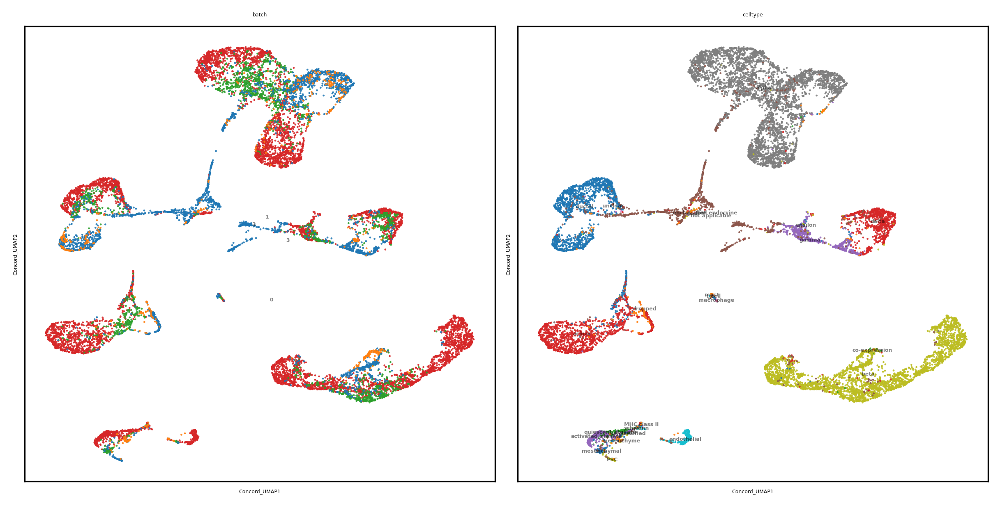

In [33]:
adata.obsm = cur_ccd.adata.obsm # If not inplace
ccd.ul.run_umap(adata, source_key=output_key, umap_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
color_by = ["batch", "celltype"]
ccd.pl.plot_embedding(
    adata, basis=show_basis, color_by=color_by, figsize=(8, 4), dpi=300, ncols=2, font_size=3, point_size=5, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

## Save the result

In [36]:
obsm_filename = save_dir / f"obsm_{file_suffix}.h5"
ccd.ul.save_obsm_to_hdf5(adata, obsm_filename)
adata.write_h5ad(f"{save_dir}/{proj_name}_{file_suffix}.h5ad")

You can optionally convert the result to VisCello (https://github.com/kimpenn/VisCello) for interactive exploration.

In [69]:
ccd.ul.anndata_to_viscello(adata, f'{save_dir}/cello_{proj_name}_{file_suffix}', project_name = proj_name, organism='dre')

R was initialized outside of rpy2 (R_NilValue != NULL). Trying to use it nevertheless.


VisCello project created at ../data/fish_tome//cello_concord_zebrafish_embryogenesis_concord_zebrafish_embryogenesis_Concordant_Oct03-1733
